In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.segmentation import quickshift
from PIL import Image
%matplotlib inline

In [2]:
# !pip install GDAL-2.4.1-cp37-cp37m-win_amd64.whl
# !pip install Fiona-1.8.6-cp37-cp37m-win_amd64.whl
#!pip install rasterio-1.0.22-cp37-cp37m-win_amd64.whl
#!pip install Cartopy-0.17.0-cp37-cp37m-win_amd64.whl

In [3]:
# !set PATH=%PATH%;C:\OSGeo4W64\bin 
#!set path = %PYTHONPATH%;C:\OSGeo4W64\share\gdal;C:\OSGeo4W64\apps\Python37\lib\site-packages
#!set GDAL_DATA = C:\OSGeo4W64\share\gdal
#!set GDAL_LIBRARY_PATH = C:\OSGeo4W64\bin\gdal204
#!set OSGEO4W_ROOT=C:\OSGeo4W64
#!pip install gdal
import sys
# sys.path.append('C:/OSGeo4W64/apps/Python37/lib/site-packages')
# sys.path.append('C:/OSGeo4W64/bin')
# sys.path.append('C:/OSGeo4W64/share/gdal')
#import osgeo
from osgeo import gdal
from osgeo import ogr
from osgeo import osr
from osgeo import gdal_array
from osgeo import gdalconst

# Загрузка изображения
http://geoinformaticstutorial.blogspot.com/2016/02/k-means-clustering-of-satellite-images.html

In [4]:
filename = "CIR_531.tif"
ds = gdal.Open(filename, gdalconst.GA_ReadOnly)

sarraster = ds.ReadAsArray()
#plt.imshow(sarraster)
gt = ds.GetGeoTransform()
proj = ds.GetProjection()
inproj = osr.SpatialReference()
inproj.ImportFromWkt(proj)
print(proj)

PROJCS["WGS 84 / UTM zone 37N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",39],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32637"]]


In [5]:
print(ds.RasterXSize)
print(ds.RasterYSize)
print(ds.RasterCount)
print(sarraster.shape)

29327
18211
3
(3, 18211, 29327)


## +Matplotlib

(10000, 14000, 3)


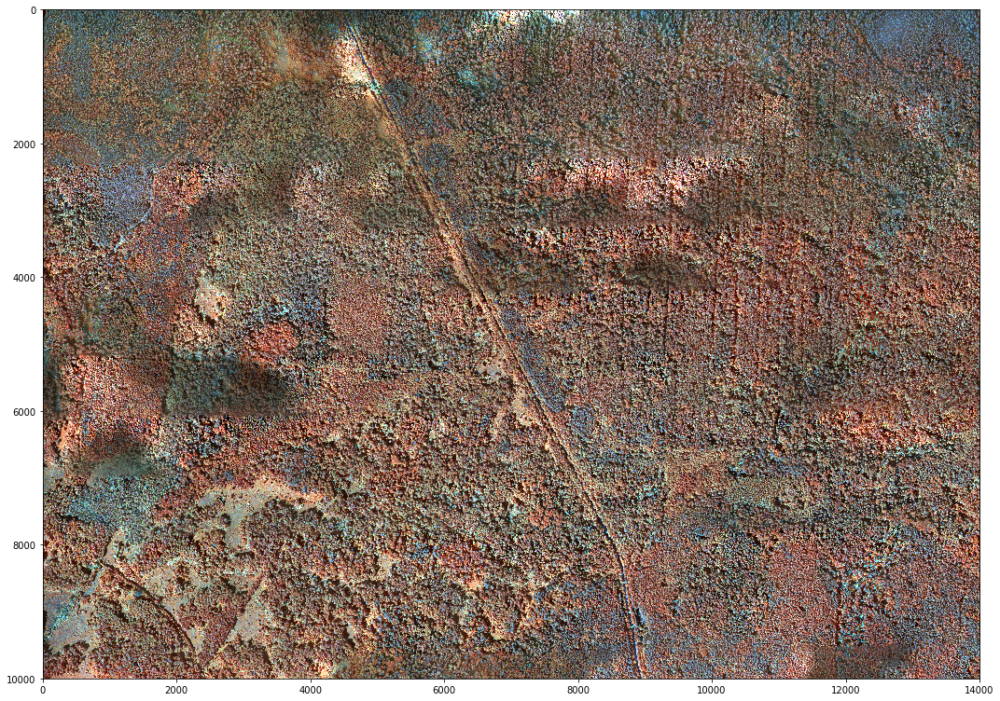

In [6]:

#print(sarraster.astype('float32'))
# bnd1 = ds.GetRasterBand(0)
# bnd2 = ds.GetRasterBand(1)
# bnd3 = ds.GetRasterBand(2)
# img1 = bnd1.ReadAsArray(0,0,ds.RasterXSize, ds.RasterYSize)
# img2 = bnd2.ReadAsArray(0,0,ds.RasterXSize, ds.RasterYSize)
# img3 = bnd3.ReadAsArray(0,0,ds.RasterXSize, ds.RasterYSize)
# img = np.dstack((img1,img2,img3))

# f = plt.figure()
sarraster2 = np.stack((sarraster[0,1000:11000,1000:15000],
                       sarraster[1,1000:11000,1000:15000],
                       sarraster[2,1000:11000,1000:15000]),axis=2)
#sarraster = None
print(sarraster2.shape)
fig = plt.figure(figsize=(18,18))
plt.imshow(sarraster2)    
plt.show()

## -GDAL

In [7]:
# srcband = ds.GetRasterBand(0)
# dst_layername = "POLYGONIZED_STUFF"
# drv = ogr.GetDriverByName("ESRI Shapefile")
# dst_ds = drv.CreateDataSource( dst_layername + ".shp" )
# dst_layer = dst_ds.CreateLayer(dst_layername, srs = None )
# gdal.Polygonize( srcband, None, dst_layer, -1, [], callback=None )

## -Cartopy

In [8]:
# !pip install geos
# !pip install proj
# import cartopy.crs as ccrs

# projcs = inproj.GetAuthorityCode('PROJCS')
# projection = ccrs.epsg(projcs)
# print(projection)

## +Rasterio

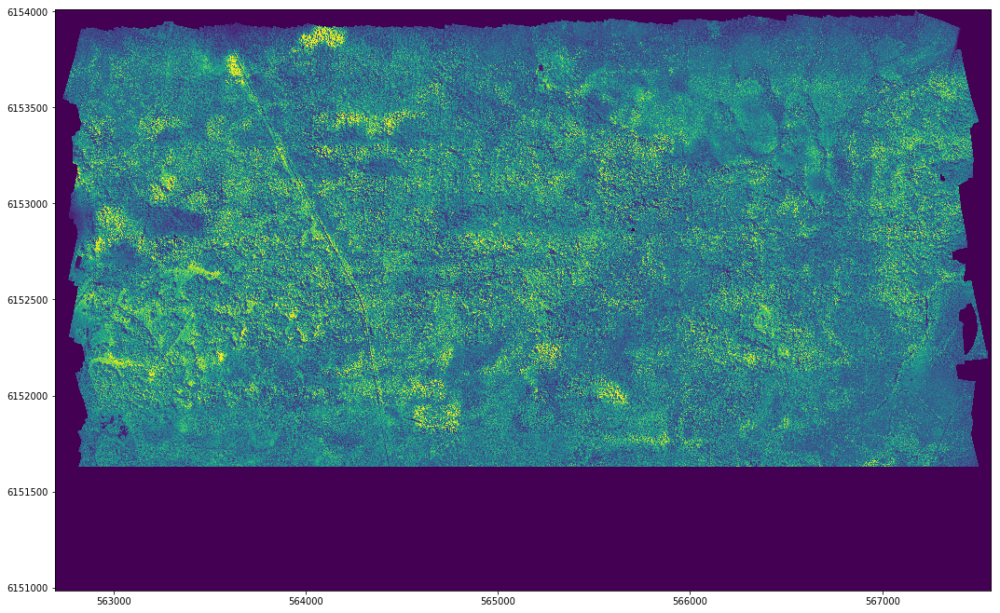

In [9]:
import rasterio
from rasterio.plot import show
ds2 = rasterio.open('CIR_531.tif')
fig2 = plt.figure(figsize=(18,18))
show(ds2)

In [10]:
# Create figure to receive results

# fig = plt.figure()
# fig.suptitle('Original')

# In first subplot add original SAR image

# ax = plt.subplot(241)
# plt.axis('off')
# ax.set_title('Original Image')
# plt.imshow(sarraster, cmap = 'gray')

# Пороговая фильтрация

In [10]:
# thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]


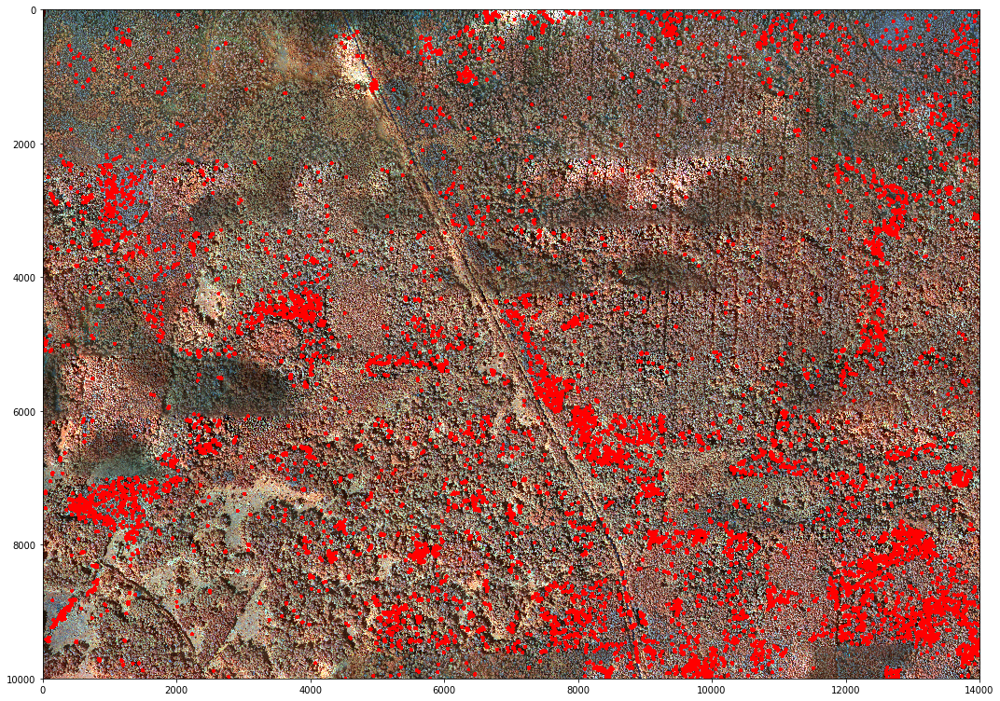

In [11]:
lower_blue = np.array([90,180,180])
upper_blue = np.array([150,255,255])
mask = cv2.inRange(sarraster2, lower_blue, upper_blue)
mask = cv2.erode(mask, None, iterations=1)
mask = cv2.dilate(mask, None, iterations=3)
#mask = cv2.erode(mask, None, iterations=2)
#mask = cv2.erode(mask, None, iterations=3)

mask2=np.copy(mask)
contours, hierarchy = cv2.findContours(mask2,
                                        cv2.RETR_TREE,#cv2.RETR_EXTERNAL,#
                                        cv2.CHAIN_APPROX_SIMPLE)
sarraster3=np.copy(sarraster2)
fig3 = plt.figure(figsize=(18,18))
# cv2.drawContours( sarraster3, contours, -1, (0,0,255),
#                  3, cv2.LINE_AA, hierarchy, 1 )
print()  
for contour in contours:
    cv2.drawContours(sarraster3, contour, -1, (255,0, 0), 50)
for contour in contours:
    cv2.drawContours(mask2, contour, -1, (255,0, 0), 50)
plt.imshow(sarraster3)  
#cv2.drawContours( mask2, contours, -1, (0,0,255),10)
plt.show()

# Кластеризация

In [14]:
print(mask[2][2])

nonzero_points=np.nonzero(mask)
print(len(nonzero_points[1])) #([i,i,i],[j,j,j],[k,k,k])
print(mask.shape)
point_cloud= np.vstack((nonzero_points[0],nonzero_points[1])).transpose()
print(point_cloud.shape)
# for (i,j) in nonzero_points:
#     np.concatenate(point_cloud,[i,j])

0
761886
(10000, 14000)
(761886, 2)


In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster
import hdbscan
import time

#!pip install seaborn
#!pip install hdbscan

# def plot_clusters(data, algorithm, args, kwds):
#     #start_time = time.time()
#     labels = algorithm(*args, **kwds).fit_predict(data)
#     print(labels)
#     #end_time = time.time()
#     palette = sns.color_palette('deep', np.unique(labels).max() + 1)
#     colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
#     plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}
#     plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
#     frame = plt.gca()
#     frame.axes.get_xaxis().set_visible(False)
#     frame.axes.get_yaxis().set_visible(False)
#     plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
#     #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=14)
    

# plot_clusters(point_cloud, hdbscan.HDBSCAN, (), {'min_cluster_size':15})
#https://hdbscan.readthedocs.io/en/latest/comparing_clustering_algorithms.html

In [27]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=5, min_samples=81).fit(point_cloud)
print(clustering.labels_)

[-1 -1 -1 ... -1 -1 -1]


In [28]:
labels = clustering.labels_
print(len(set(labels))-(1 if -1 in labels else 0))
#points_filtered = point_cloud[df.tweet_cluster_labels>-1]
print(point_cloud.shape)

core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_] = True

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print(n_clusters_)
print(n_noise_)

1221
(761886, 2)
1221
519596


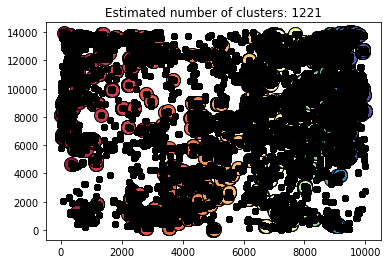

In [86]:
# unique_labels = set(labels)
# colors = [plt.cm.Spectral(each)
#           for each in np.linspace(0, 1, len(unique_labels))]
# for k, col in zip(unique_labels, colors):
#     if k == -1:
#         # Black used for noise.
#         col = [0, 0, 0, 1]

#     class_member_mask = (labels == k)

#     xy = point_cloud[class_member_mask & core_samples_mask]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
#              markeredgecolor='k', markersize=14)

#     xy = point_cloud[class_member_mask & ~core_samples_mask]
#     plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
#              markeredgecolor='k', markersize=6)

# plt.title('Estimated number of clusters: %d' % n_clusters_)
# plt.show()

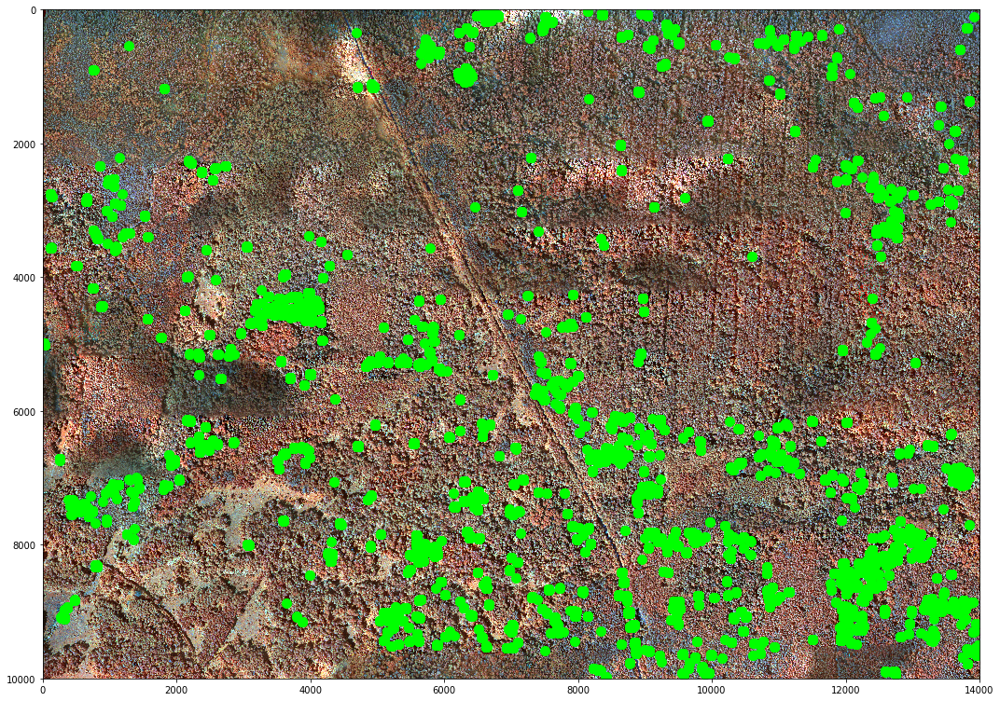

In [20]:
fig = plt.figure(figsize=(18,18))
plt.imshow(sarraster2)

unique_labels = set(labels)
# colors = [plt.cm.Spectral(each)
#           for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = point_cloud[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor='lime',
             markeredgecolor='lime', markersize=10)

#     xy = point_cloud[class_member_mask & ~core_samples_mask]
#     plt.plot(xy[:, 1], xy[:, 0], 'o', markerfacecolor=tuple(col),
#              markeredgecolor='k', markersize=6)

plt.show()

# Оконтуривание
https://docs.scipy.org/doc/scipy-0.19.0/reference/generated/scipy.spatial.ConvexHull.html

In [ ]:
from scipy.spatial import ConvexHull
allPoints=np.column_stack((LATS,LONGS))
hullPoints = ConvexHull(allPoints)

# Запись GeoJSON

# Контроль GeoJSON